In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
pd.set_option('display.float_format', '{:.4f}'.format)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Dataset description

In [10]:
data = pd.read_csv("/kaggle/input/autompg-dataset/auto-mpg.csv")
data

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin,car name
0,18.0000,8,307.0000,130,3504,12.0000,70,1,chevrolet chevelle malibu
1,15.0000,8,350.0000,165,3693,11.5000,70,1,buick skylark 320
2,18.0000,8,318.0000,150,3436,11.0000,70,1,plymouth satellite
3,16.0000,8,304.0000,150,3433,12.0000,70,1,amc rebel sst
4,17.0000,8,302.0000,140,3449,10.5000,70,1,ford torino
...,...,...,...,...,...,...,...,...,...
393,27.0000,4,140.0000,86,2790,15.6000,82,1,ford mustang gl
394,44.0000,4,97.0000,52,2130,24.6000,82,2,vw pickup
395,32.0000,4,135.0000,84,2295,11.6000,82,1,dodge rampage
396,28.0000,4,120.0000,79,2625,18.6000,82,1,ford ranger


## Data source

https://archive.ics.uci.edu/dataset/9/auto+mpg


## Variable Information

<table>
  <tr>
    <th>Variable Name</th>
    <th>Role</th>
    <th>Type</th>
    <th>Demographic</th>
    <th>Description</th>
    <th>Units</th>
    <th>Missing Values</th>
  </tr>
  <tr>
    <td>displacement</td>
    <td>Feature</td>
    <td>Continuous</td>
    <td></td>
    <td></td>
    <td></td>
    <td>no</td>
  </tr>
  <tr>
    <td>mpg</td>
    <td>Target</td>
    <td>Continuous</td>
    <td></td>
    <td></td>
    <td></td>
    <td>no</td>
  </tr>
  <tr>
    <td>cylinders</td>
    <td>Feature</td>
    <td>Integer</td>
    <td></td>
    <td></td>
    <td></td>
    <td>no</td>
  </tr>
  <tr>
    <td>horsepower</td>
    <td>Feature</td>
    <td>Continuous</td>
    <td></td>
    <td></td>
    <td></td>
    <td>yes</td>
  </tr>
  <tr>
    <td>weight</td>
    <td>Feature</td>
    <td>Continuous</td>
    <td></td>
    <td></td>
    <td></td>
    <td>no</td>
  </tr>
  <tr>
    <td>acceleration</td>
    <td>Feature</td>
    <td>Continuous</td>
    <td></td>
    <td></td>
    <td></td>
    <td>no</td>
  </tr>
  <tr>
    <td>model_year</td>
    <td>Feature</td>
    <td>Integer</td>
    <td></td>
    <td></td>
    <td></td>
    <td>no</td>
  </tr>
  <tr>
    <td>origin</td>
    <td>Feature</td>
    <td>Integer</td>
    <td></td>
    <td></td>
    <td></td>
    <td>no</td>
  </tr>
  <tr>
    <td>car_name</td>
    <td>ID</td>
    <td>Categorical</td>
    <td></td>
    <td></td>
    <td></td>
    <td>no</td>
  </tr>
</table>



In [5]:
# Descrite feature 
categorical_features = ['origin','cylinders','model year' ]
# continous features 
numeric_features = ['mpg', 'displacement', 'horsepower',
                    'weight', 'acceleration' ] 

# Exploratory data analysis

## Label mapping of origin

### mapping table 

<table border="1">
  <tr>
    <th>#</th>
    <th>Country</th>
  </tr>
  <tr>
    <td>1</td>
    <td>USA</td>
  </tr>
  <tr>
    <td>2</td>
    <td>Europe</td>
  </tr>
  <tr>
    <td>3</td>
    <td>Japan</td>
  </tr>
</table>

In [49]:
data['origin'].value_counts()

origin
1    249
3     79
2     70
Name: count, dtype: int64

In [5]:
# map numbers to the corresponding manifacturing country
data['origin'] = data.origin.replace([1,2,3],['USA','Europe','Japan'])
data

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin,car name
0,18.0000,8,307.0000,130,3504,12.0000,70,USA,chevrolet chevelle malibu
1,15.0000,8,350.0000,165,3693,11.5000,70,USA,buick skylark 320
2,18.0000,8,318.0000,150,3436,11.0000,70,USA,plymouth satellite
3,16.0000,8,304.0000,150,3433,12.0000,70,USA,amc rebel sst
4,17.0000,8,302.0000,140,3449,10.5000,70,USA,ford torino
...,...,...,...,...,...,...,...,...,...
393,27.0000,4,140.0000,86,2790,15.6000,82,USA,ford mustang gl
394,44.0000,4,97.0000,52,2130,24.6000,82,Europe,vw pickup
395,32.0000,4,135.0000,84,2295,11.6000,82,USA,dodge rampage
396,28.0000,4,120.0000,79,2625,18.6000,82,USA,ford ranger


In [51]:
data['origin'].value_counts()

origin
USA       249
Japan      79
Europe     70
Name: count, dtype: int64

## Checking for duplicates

In [28]:
# Check for duplicated samples
data.duplicated().sum()

0

In [30]:
# Check for duplicated samples of the same car
data.duplicated(subset = ["car name", "origin", "model year"]).sum()

2

In [39]:
data[data[["car name", "origin", "model year"]].duplicated(keep = False)]

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin,car name
168,23.0000,4,140.0000,83,2639,17.0000,75,USA,ford pinto
174,18.0000,6,171.0000,97,2984,14.5000,75,USA,ford pinto
338,27.2000,4,135.0000,84,2490,15.7000,81,USA,plymouth reliant
342,30.0000,4,135.0000,84,2385,12.9000,81,USA,plymouth reliant


> There is two samples for each of these two cars but with different data so it's fine to keep them 

In [11]:
# Drop car name 
data = data.drop('car name', axis=1)
data

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin
0,18.0000,8,307.0000,130,3504,12.0000,70,1
1,15.0000,8,350.0000,165,3693,11.5000,70,1
2,18.0000,8,318.0000,150,3436,11.0000,70,1
3,16.0000,8,304.0000,150,3433,12.0000,70,1
4,17.0000,8,302.0000,140,3449,10.5000,70,1
...,...,...,...,...,...,...,...,...
393,27.0000,4,140.0000,86,2790,15.6000,82,1
394,44.0000,4,97.0000,52,2130,24.6000,82,2
395,32.0000,4,135.0000,84,2295,11.6000,82,1
396,28.0000,4,120.0000,79,2625,18.6000,82,1


## Checking for missing values 

In [53]:
# check for missing values 
data.isna().sum()

mpg             0
cylinders       0
displacement    0
horsepower      0
weight          0
acceleration    0
model year      0
origin          0
dtype: int64

In [12]:
# Some times the missing values would have '?' as a place holdder
(data == '?').sum()

mpg             0
cylinders       0
displacement    0
horsepower      6
weight          0
acceleration    0
model year      0
origin          0
dtype: int64

In [13]:
# Drop missing values
data.drop(data[data['horsepower'] == '?'].index, inplace=True)
(data == '?').sum()

mpg             0
cylinders       0
displacement    0
horsepower      0
weight          0
acceleration    0
model year      0
origin          0
dtype: int64

## Data type check

In [56]:
# Features type
data.dtypes

mpg             float64
cylinders         int64
displacement    float64
horsepower       object
weight            int64
acceleration    float64
model year        int64
origin           object
dtype: object

In [57]:
# Convert the horsepower object to float
data.horsepower = data.horsepower.astype('float')
data.dtypes

mpg             float64
cylinders         int64
displacement    float64
horsepower      float64
weight            int64
acceleration    float64
model year        int64
origin           object
dtype: object

> origin is kept as object because it will be mapped back to numbers to calculate correlation

## Visualization of categorical features

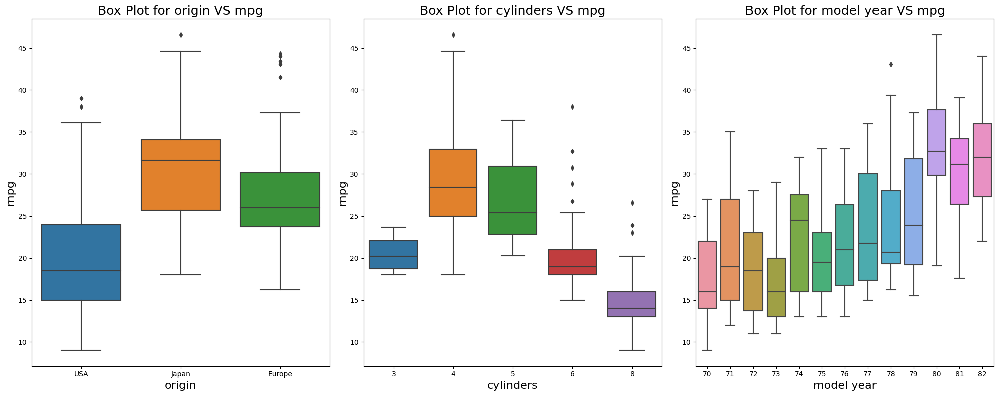

In [46]:
# Box plot of categorical features VS mpg
title_size = 18
x_y_label_size = 16

fig, axes = plt.subplots(1, 3, figsize=(20, 8))  # 1 row, 3 columns subplot

# Box plot for feature1
sns.boxplot(x='origin', y='mpg', data=data, ax=axes[0])
axes[0].set_title('Box Plot for origin VS mpg', fontsize=title_size)
axes[0].set_xlabel('origin', fontsize=x_y_label_size)
axes[0].set_ylabel('mpg', fontsize=x_y_label_size)

# Box plot for feature2
sns.boxplot(x='cylinders', y='mpg', data=data, ax=axes[1])
axes[1].set_title('Box Plot for cylinders VS mpg', fontsize=title_size)
axes[1].set_xlabel('cylinders', fontsize=x_y_label_size)
axes[1].set_ylabel('mpg', fontsize=x_y_label_size)

# Box plot for feature3
sns.boxplot(x='model year', y='mpg', data=data, ax=axes[2])
axes[2].set_title('Box Plot for model year VS mpg', fontsize=title_size)
axes[2].set_xlabel('model year', fontsize=x_y_label_size)
axes[2].set_ylabel('mpg', fontsize=x_y_label_size)

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig('categories_box_plots.png', dpi=900)
plt.show()

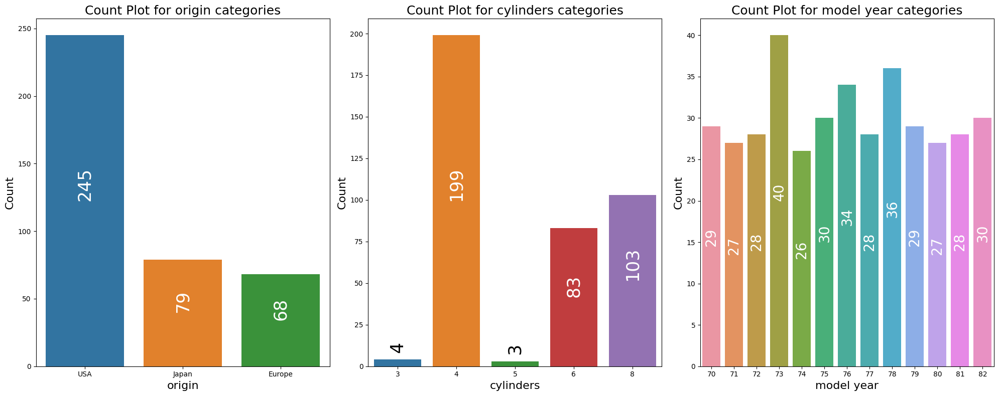

In [17]:
# Count plot of categorical features 

# Font sizes for titles and axis labels
title_size = 18
x_y_label_size = 16

fig, axes = plt.subplots(1, 3, figsize=(20, 8))  # 1 row, 3 columns subplot

# Bar plot for feature1
ax1 = sns.countplot(x='origin', data=data, ax=axes[0])
ax1.set_title('Count Plot for origin categories', fontsize=title_size)
ax1.set_xlabel('origin', fontsize=x_y_label_size)
ax1.set_ylabel('Count', fontsize=x_y_label_size)

# Bar plot for feature2
ax2 = sns.countplot(x='cylinders', data=data, ax=axes[1])
ax2.set_title('Count Plot for cylinders categories', fontsize=title_size)
ax2.set_xlabel('cylinders', fontsize=x_y_label_size)
ax2.set_ylabel('Count', fontsize=x_y_label_size)

# Bar plot for feature3
ax3 = sns.countplot(x='model year', data=data, ax=axes[2])
ax3.set_title('Count Plot for model year categories', fontsize=title_size)
ax3.set_xlabel('model year', fontsize=x_y_label_size)
ax3.set_ylabel('Count', fontsize=x_y_label_size)

# Font sizes for count labels on each subplot
count_font_sizes = [25, 25, 20]  # Add or modify font sizes as needed

# Display count values on bars with specified conditions and individual font sizes
for i, ax in enumerate([ax1, ax2, ax3]):
    for p in ax.patches:
        font_size = count_font_sizes[i]
        if p.get_height() < 0.2 * ax.get_ylim()[1]:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height() + 0.02 * ax.get_ylim()[1]),
                        ha='center', va='bottom', color='black', fontsize=font_size, rotation =90)
        else:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height() / 2),
                        ha='center', va='bottom', color='white', fontsize=font_size, rotation =90)

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig('categories_bar_plots.png', dpi=900)
plt.show()

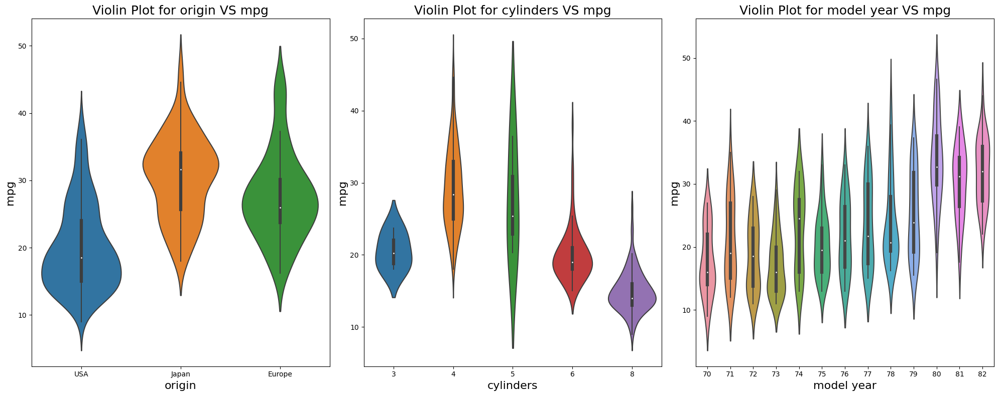

In [16]:
# Violin plot of categorical features VS mpg
title_size = 18
x_y_label_size = 16

fig, axes = plt.subplots(1, 3, figsize=(20, 8))  # 1 row, 3 columns subplot

# Box plot for feature1
sns.violinplot(x='origin', y='mpg', data=data, ax=axes[0])
axes[0].set_title('Violin Plot for origin VS mpg', fontsize=title_size)
axes[0].set_xlabel('origin', fontsize=x_y_label_size)
axes[0].set_ylabel('mpg', fontsize=x_y_label_size)

# Box plot for feature2
sns.violinplot(x='cylinders', y='mpg', data=data, ax=axes[1])
axes[1].set_title('Violin Plot for cylinders VS mpg', fontsize=title_size)
axes[1].set_xlabel('cylinders', fontsize=x_y_label_size)
axes[1].set_ylabel('mpg', fontsize=x_y_label_size)

# Box plot for feature3
sns.violinplot(x='model year', y='mpg', data=data, ax=axes[2])
axes[2].set_title('Violin Plot for model year VS mpg', fontsize=title_size)
axes[2].set_xlabel('model year', fontsize=x_y_label_size)
axes[2].set_ylabel('mpg', fontsize=x_y_label_size)2
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig('categories_violin_plots.png', dpi=900)
plt.show()

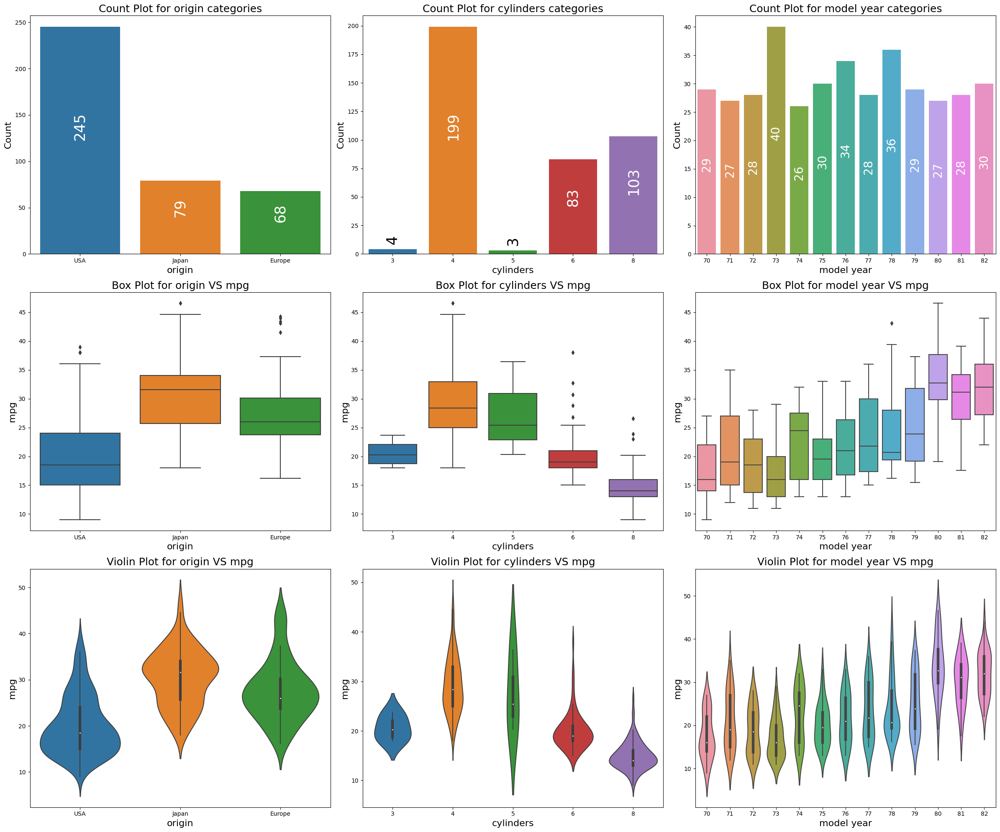

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Font sizes for titles and axis labels
title_size = 18
x_y_label_size = 16

fig, axes = plt.subplots(3, 3, figsize=(24, 20))  # 3 rows, 3 columns subplot

# First Row: Count Plots
# Bar plot for feature1
ax1 = sns.countplot(x='origin', data=data, ax=axes[0, 0])
ax1.set_title('Count Plot for origin categories', fontsize=title_size)
ax1.set_xlabel('origin', fontsize=x_y_label_size)
ax1.set_ylabel('Count', fontsize=x_y_label_size)

# Bar plot for feature2
ax2 = sns.countplot(x='cylinders', data=data, ax=axes[0, 1])
ax2.set_title('Count Plot for cylinders categories', fontsize=title_size)
ax2.set_xlabel('cylinders', fontsize=x_y_label_size)
ax2.set_ylabel('Count', fontsize=x_y_label_size)

# Bar plot for feature3
ax3 = sns.countplot(x='model year', data=data, ax=axes[0, 2])
ax3.set_title('Count Plot for model year categories', fontsize=title_size)
ax3.set_xlabel('model year', fontsize=x_y_label_size)
ax3.set_ylabel('Count', fontsize=x_y_label_size)

# Font sizes for count labels on each subplot
count_font_sizes = [25, 25, 20]  # Add or modify font sizes as needed

# Display count values on bars with specified conditions and individual font sizes
for i, ax in enumerate([ax1, ax2, ax3]):
    for p in ax.patches:
        font_size = count_font_sizes[i]
        if p.get_height() < 0.2 * ax.get_ylim()[1]:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height() + 0.02 * ax.get_ylim()[1]),
                        ha='center', va='bottom', color='black', fontsize=font_size, rotation=90)
        else:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height() / 2),
                        ha='center', va='bottom', color='white', fontsize=font_size, rotation=90)

# Second Row: Box Plots
# Box plot for feature1
ax4 = sns.boxplot(x='origin', y='mpg', data=data, ax=axes[1, 0])
ax4.set_title('Box Plot for origin VS mpg', fontsize=title_size)
ax4.set_xlabel('origin', fontsize=x_y_label_size)
ax4.set_ylabel('mpg', fontsize=x_y_label_size)

# Box plot for feature2
ax5 = sns.boxplot(x='cylinders', y='mpg', data=data, ax=axes[1, 1])
ax5.set_title('Box Plot for cylinders VS mpg', fontsize=title_size)
ax5.set_xlabel('cylinders', fontsize=x_y_label_size)
ax5.set_ylabel('mpg', fontsize=x_y_label_size)

# Box plot for feature3
ax6 = sns.boxplot(x='model year', y='mpg', data=data, ax=axes[1, 2])
ax6.set_title('Box Plot for model year VS mpg', fontsize=title_size)
ax6.set_xlabel('model year', fontsize=x_y_label_size)
ax6.set_ylabel('mpg', fontsize=x_y_label_size)

# Third Row: Violin Plots
# Violin plot for feature1
ax7 = sns.violinplot(x='origin', y='mpg', data=data, ax=axes[2, 0])
ax7.set_title('Violin Plot for origin VS mpg', fontsize=title_size)
ax7.set_xlabel('origin', fontsize=x_y_label_size)
ax7.set_ylabel('mpg', fontsize=x_y_label_size)

# Violin plot for feature2
ax8 = sns.violinplot(x='cylinders', y='mpg', data=data, ax=axes[2, 1])
ax8.set_title('Violin Plot for cylinders VS mpg', fontsize=title_size)
ax8.set_xlabel('cylinders', fontsize=x_y_label_size)
ax8.set_ylabel('mpg', fontsize=x_y_label_size)

# Violin plot for feature3
ax9 = sns.violinplot(x='model year', y='mpg', data=data, ax=axes[2, 2])
ax9.set_title('Violin Plot for model year VS mpg', fontsize=title_size)
ax9.set_xlabel('model year', fontsize=x_y_label_size)
ax9.set_ylabel('mpg', fontsize=x_y_label_size)

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig('categorical_combined.png', dpi=1000)
plt.show()

## Describtive statistics of continous features

In [152]:
# Descriptive statistics for continous features
data[numeric_features].describe().to_csv('describtion of numeric features.csv', index=True)
data[numeric_features].describe() 

,mpg,displacement,horsepower,weight,acceleration
count,392.0000,392.0000,392.0000,392.0000,392.0000
mean,23.4459,194.4120,104.4694,2977.5842,15.5413
std,7.8050,104.6440,38.4912,849.4026,2.7589
min,9.0000,68.0000,46.0000,1613.0000,8.0000
25%,17.0000,105.0000,75.0000,2225.2500,13.7750
50%,22.7500,151.0000,93.5000,2803.5000,15.5000
75%,29.0000,275.7500,126.0000,3614.7500,17.0250
max,46.6000,455.0000,230.0000,5140.0000,24.8000


## Visualization of continous features

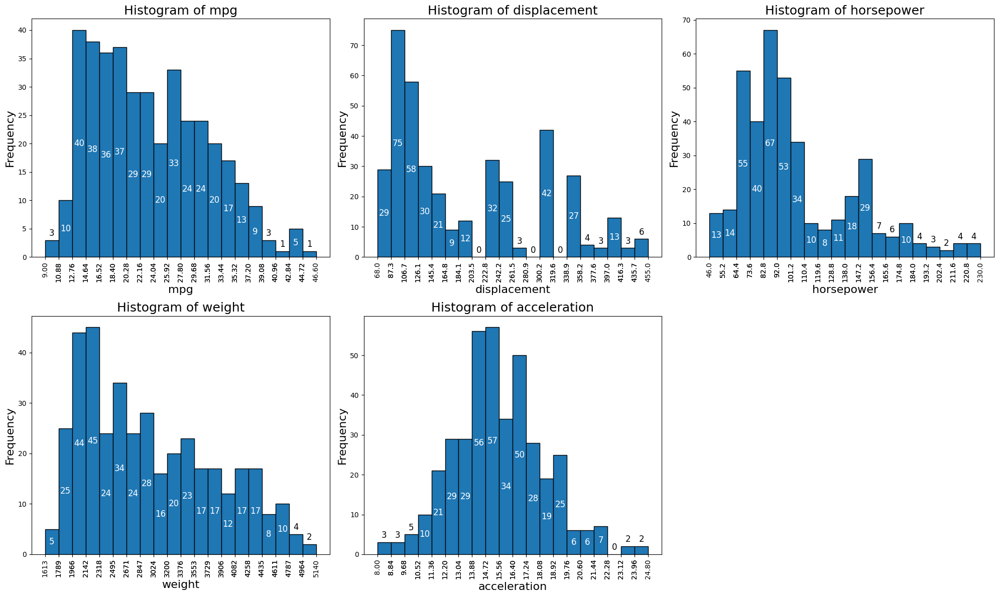

In [14]:
# Histogram of continous features

# Font sizes for titles and axis labels
title_size = 18
label_font_size = 16

# Font size for count labels on each subplot
count_font_size = 12  # Adjust font size as needed

fig, axes = plt.subplots(2, 3, figsize=(20, 12))  # 2 rows, 3 columns subplot

# Features to plot
numeric_features = ['mpg', 'displacement', 'horsepower', 'weight', 'acceleration']

for i, feature in enumerate(numeric_features):
    row, col = divmod(i, 3)  # Calculate the row and column for each subplot
    ax = axes[row,col]
    values, edges, patches = ax.hist(data[feature], bins=20, edgecolor='k')
    # Set titles and axis labels
    ax.set_title(f'Histogram of {feature}', fontsize=title_size)
    ax.set_xlabel(feature, fontsize=label_font_size)
    ax.set_ylabel('Frequency', fontsize=label_font_size)

    # Display values at the edges of every bin
    bins = []
    for i in range(len(edges) - 1):
        bin_start = edges[i]
        bin_end = edges[i + 1]

        bins.append(bin_start)
        bins.append(bin_end)
        bin_center = (bin_start + bin_end) / 2
        freq = values[i]
        if int(freq) > 0.1 * ax.get_ylim()[1]:
            ax.text(bin_center, freq / 2, str(int(freq)),
                    ha='center', va='center', color='white', fontsize=count_font_size)
        else:
            ax.text(bin_center, freq + 0.01 * ax.get_ylim()[1] , str(int(freq)),
                    ha='center', va='bottom', fontsize=count_font_size)

    # Set x-ticks
    ax.set_xticks(bins)
    ax.tick_params(axis='x', labelrotation=90)

# Remove any unused subplots
for j in range(len(numeric_features), 6):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()  # Adjust layout to prevent overlapping
# plt.savefig('continous_hist_plot.png', dpi=900)
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

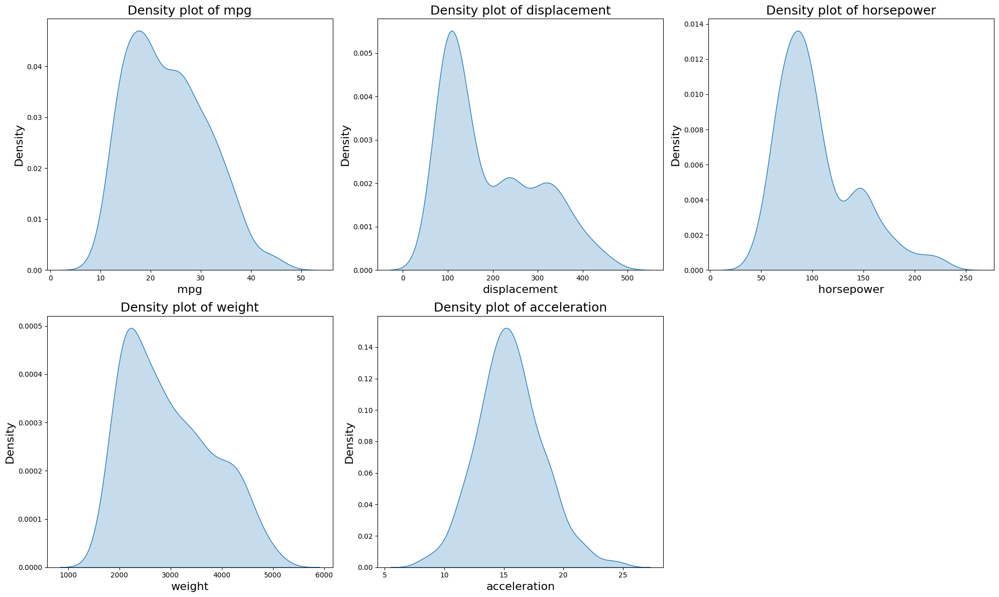

In [18]:
# Density plot of continous features

# Font sizes for titles and axis labels
title_size = 18
label_font_size = 16

# Font size for count labels on each subplot
count_font_size = 12  # Adjust font size as needed

fig, axes = plt.subplots(2, 3, figsize=(20, 12))  # 2 rows, 3 columns subplot

# Features to plot
numeric_features = ['mpg', 'displacement', 'horsepower', 'weight', 'acceleration']

for i, feature in enumerate(numeric_features):
    row, col = divmod(i, 3)  # Calculate the row and column for each subplot
    ax = axes[row,col]
    sns.kdeplot(data[feature], fill=True , ax=ax,common_norm=False)
    # Set titles and axis labels
    ax.set_title(f'Density plot of {feature}', fontsize=title_size)
    ax.set_xlabel(feature, fontsize=label_font_size)
    ax.set_ylabel('Density', fontsize=label_font_size)

    
# Remove any unused subplots
for j in range(len(numeric_features), 6):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig('continous_density_plot.png', dpi=900)
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

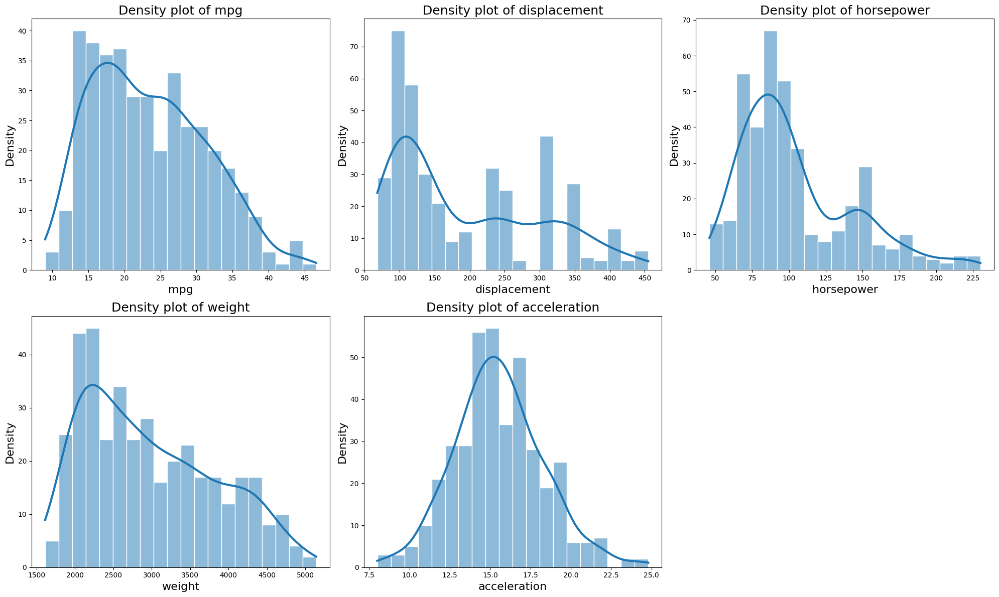

In [19]:
# Histogram with kde curve plot of continous features

# Font sizes for titles and axis labels
title_size = 18
label_font_size = 16

# Font size for count labels on each subplot
count_font_size = 12  # Adjust font size as needed

fig, axes = plt.subplots(2, 3, figsize=(20, 12))  # 2 rows, 3 columns subplot

# Features to plot
numeric_features = ['mpg', 'displacement', 'horsepower', 'weight', 'acceleration']

for i, feature in enumerate(numeric_features):
    row, col = divmod(i, 3)  # Calculate the row and column for each subplot
    ax = axes[row,col]
    sns.histplot(data[feature], bins=20, kde=True, edgecolor='white', ax=ax, line_kws={"linewidth": 3})
    # Set titles and axis labels
    ax.set_title(f'Density plot of {feature}', fontsize=title_size)
    ax.set_xlabel(feature, fontsize=label_font_size)
    ax.set_ylabel('Density', fontsize=label_font_size)

    
# Remove any unused subplots
for j in range(len(numeric_features), 6):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig('continous_hist_kde_plot.png', dpi=900)
plt.show()

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

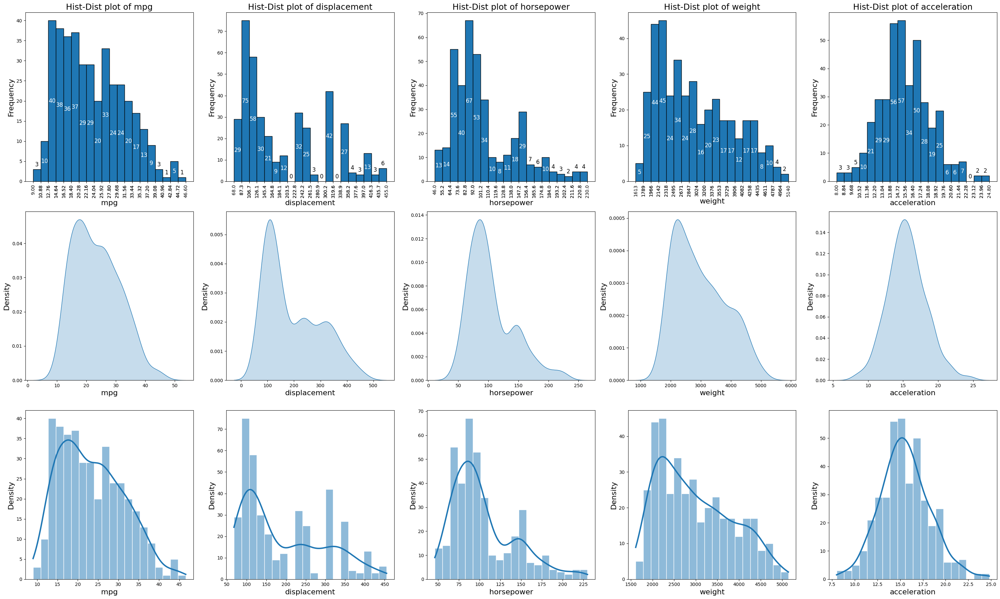

In [23]:
# Continious combined 

# Font sizes for titles and axis labels
title_size = 18
label_font_size = 16
count_font_size = 12  # Adjust font size as needed

fig, axes = plt.subplots(3, 5, figsize=(30, 18))  # 2 rows, 5 columns subplot

# Features to plot
numeric_features = ['mpg', 'displacement', 'horsepower', 'weight', 'acceleration']

for i, feature in enumerate(numeric_features):
    
    # Plotting histograms without KDE (first row)
    ax = axes[0, i]
    values, edges, patches = ax.hist(data[feature], bins=20, edgecolor='k')

    # Set titles and axis labels
    ax.set_title(f'Hist-Dist plot of {feature}', fontsize=title_size)
    ax.set_xlabel(feature, fontsize=label_font_size)
    ax.set_ylabel('Frequency', fontsize=label_font_size)

    # Display values at the edges of every bin
    bins = []
    for j in range(len(edges) - 1):
        bin_start = edges[j]
        bin_end = edges[j + 1]

        bins.append(bin_start)
        bins.append(bin_end)
        bin_center = (bin_start + bin_end) / 2
        freq = values[j]
        if int(freq) > 0.1 * ax.get_ylim()[1]:
            ax.text(bin_center, freq / 2, str(int(freq)),
                    ha='center', va='center', color='white', fontsize=count_font_size)
        else:
            ax.text(bin_center, freq + 0.01 * ax.get_ylim()[1], str(int(freq)),
                    ha='center', va='bottom', fontsize=count_font_size)

    # Set x-ticks
    ax.set_xticks(bins)
    ax.tick_params(axis='x', labelrotation=90)
    
    # Plotting density plot  
    ax = axes[1, i  ]
    sns.kdeplot(data[feature], fill=True , ax=ax,common_norm=False)

    # Set titles and axis labels
    ax.set_xlabel(feature, fontsize=label_font_size)
    ax.set_ylabel('Density', fontsize=label_font_size)
    
    # Plotting histograms with KDE (second row)
    ax = axes[2, i  ]
    sns.histplot(data[feature], bins=20, kde=True, edgecolor='white', ax=ax, line_kws={"linewidth": 3})

    # Set titles and axis labels
    ax.set_xlabel(feature, fontsize=label_font_size)
    ax.set_ylabel('Density', fontsize=label_font_size)
    
    

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.savefig('continous_hist_dist_plot.png', dpi=1000)
plt.show()

## Pair plot

/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3

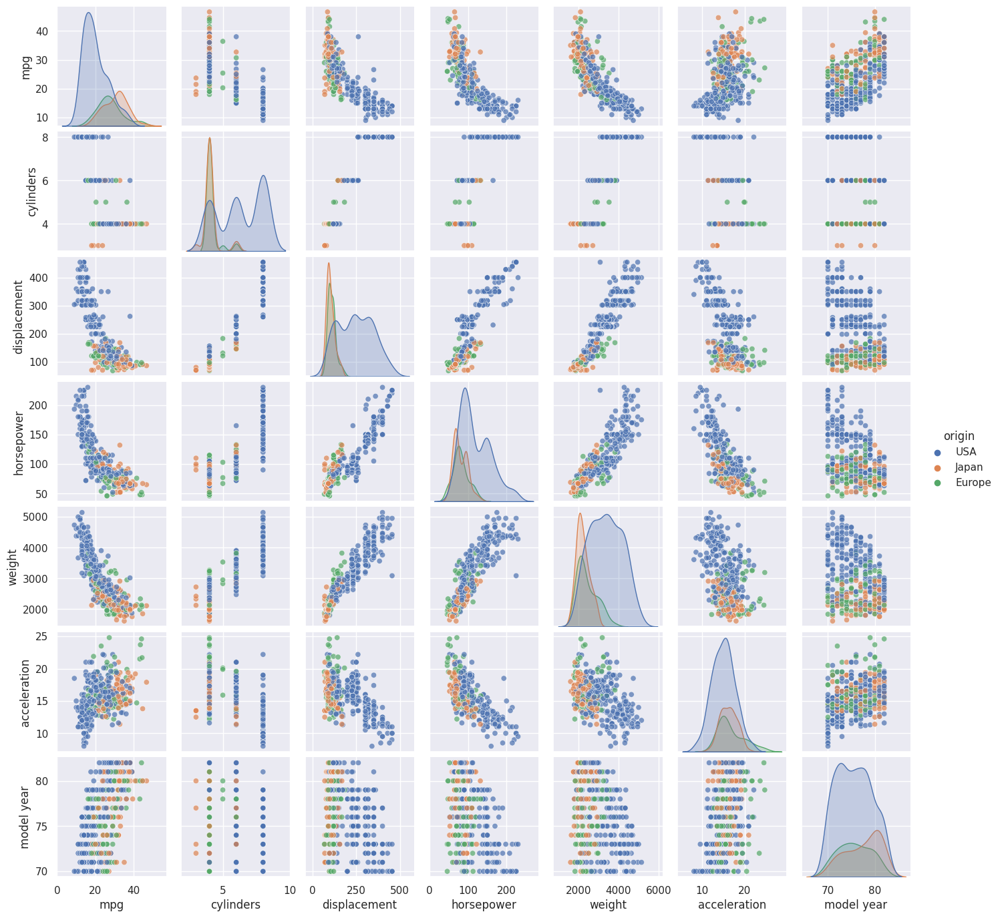

In [16]:
sns.set()
sns.pairplot(data, size = 2.0, hue='origin', plot_kws={'alpha': 0.7})
plt.savefig('pair_plot.png', dpi=950)
plt.show()

## Correlation heatmap

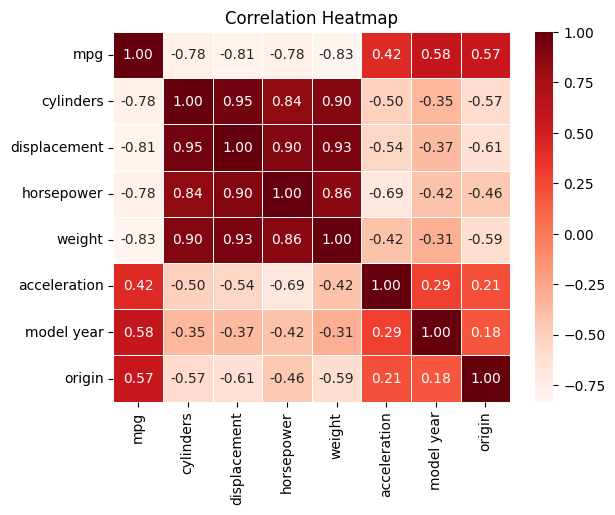

In [58]:
# Visualize correlation as a heatmap
data['origin'] = data.origin.replace(['USA','Europe','Japan'], [1,2,3])
# plt.figure(figsize=(8, 6))
sns.heatmap(data.corr(), cmap='Reds',annot=True, fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap')

plt.savefig('corr_heatmap.png', dpi=900)
plt.show()

In [14]:
data['origin'] = data.origin.replace([1,2,3], ['USA','Europe','Japan'])
data

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin
0,18.0000,8,307.0000,130,3504,12.0000,70,USA
1,15.0000,8,350.0000,165,3693,11.5000,70,USA
2,18.0000,8,318.0000,150,3436,11.0000,70,USA
3,16.0000,8,304.0000,150,3433,12.0000,70,USA
4,17.0000,8,302.0000,140,3449,10.5000,70,USA
...,...,...,...,...,...,...,...,...
393,27.0000,4,140.0000,86,2790,15.6000,82,USA
394,44.0000,4,97.0000,52,2130,24.6000,82,Europe
395,32.0000,4,135.0000,84,2295,11.6000,82,USA
396,28.0000,4,120.0000,79,2625,18.6000,82,USA


## Pandas profile report 

In [83]:
from pandas_profiling import ProfileReport
report = ProfileReport(data)
report.to_file("profile_report.html")
report.to_notebook_iframe()

> To view this profile report in a web page click [here](https://automobile-mile-per-gallon-prediction.tiiny.site)

In [18]:
X = data.drop(['mpg'], axis = 1)
Y = data['mpg'].values
X

,cylinders,displacement,horsepower,weight,acceleration,model year,origin
0,8,307.0000,130,3504,12.0000,70,USA
1,8,350.0000,165,3693,11.5000,70,USA
2,8,318.0000,150,3436,11.0000,70,USA
3,8,304.0000,150,3433,12.0000,70,USA
4,8,302.0000,140,3449,10.5000,70,USA
...,...,...,...,...,...,...,...
393,4,140.0000,86,2790,15.6000,82,USA
394,4,97.0000,52,2130,24.6000,82,Europe
395,4,135.0000,84,2295,11.6000,82,USA
396,4,120.0000,79,2625,18.6000,82,USA


# Feature encoding 

## One-hot encoding of origin

### Mapping table 
<table border="1">
  <tr>
    <th></th>
    <th>is_USA</th>
    <th>is_Europe</th>
  </tr>
  <tr>
    <td>USA</td>
    <td>1</td>
    <td>0</td>
  </tr>
  <tr>
    <td>Europe</td>
    <td>0</td>
    <td>1</td>
  </tr>
  <tr>
    <td>Japan</td>
    <td>0</td>
    <td>0</td>
  </tr>
</table>

> Note that these three categories were encoded in 2 columns to avoid the dummy variable trap

In [19]:
X['is_USA'] = (X['origin'] == 'USA').astype(int)
X['is_Europe'] = (X['origin'] == 'Europe').astype(int)
X = X.drop('origin', axis=1)
X

,cylinders,displacement,horsepower,weight,acceleration,model year,is_USA,is_Europe
0,8,307.0000,130,3504,12.0000,70,1,0
1,8,350.0000,165,3693,11.5000,70,1,0
2,8,318.0000,150,3436,11.0000,70,1,0
3,8,304.0000,150,3433,12.0000,70,1,0
4,8,302.0000,140,3449,10.5000,70,1,0
...,...,...,...,...,...,...,...,...
393,4,140.0000,86,2790,15.6000,82,1,0
394,4,97.0000,52,2130,24.6000,82,0,1
395,4,135.0000,84,2295,11.6000,82,1,0
396,4,120.0000,79,2625,18.6000,82,1,0


# Feature scaling with MinMaxScaler

In [21]:
from sklearn.preprocessing import MinMaxScaler
x_scaler = MinMaxScaler()
X[:] = x_scaler.fit_transform(X[:])
X

,cylinders,displacement,horsepower,weight,acceleration,model year,is_USA,is_Europe
0,1.0000,0.6176,0.4565,0.5361,0.2381,0.0000,1,0
1,1.0000,0.7287,0.6467,0.5897,0.2083,0.0000,1,0
2,1.0000,0.6460,0.5652,0.5169,0.1786,0.0000,1,0
3,1.0000,0.6098,0.5652,0.5160,0.2381,0.0000,1,0
4,1.0000,0.6047,0.5109,0.5206,0.1488,0.0000,1,0
...,...,...,...,...,...,...,...,...
393,0.2000,0.1860,0.2174,0.3337,0.4524,1.0000,1,0
394,0.2000,0.0749,0.0326,0.1466,0.9881,1.0000,0,1
395,0.2000,0.1731,0.2065,0.1934,0.2143,1.0000,1,0
396,0.2000,0.1344,0.1793,0.2869,0.6310,1.0000,1,0


In [90]:
# save the scaler 
from pickle import dump

with open('x_scaler.pkl', 'wb') as file:
    dump(x_scaler, file)

In [42]:
Y = Y.reshape(-1,1)
X = X.values

# Train-Test split (0.8:0.2)

In [60]:
# train-test split
x_train, x_test, y_train, y_test = train_test_split(X,Y, test_size = 0.2)
print('No. of training samples:',len(y_train))
print('No. of testing samples:',len(y_test))

No. of training samples: 313
No. of testing samples: 79


# Modeling 

In [44]:
from keras.models import  Sequential 
from keras.layers import Dense 
from keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(
    filepath='best_model.h5',
    save_weights_only=False,
    monitor='val_loss',
    mode='min',
    save_best_only=True,
    verbose=0)

model = Sequential([
     Dense(64, input_dim=8 , activation='linear'),
     Dense(64 , activation='linear'),
     Dense(1)
])

model.compile(loss='mse' , optimizer = 'adam', metrics=['mae'] ) 

> Checkpoint callback with the previous settings saves the model when ever the monitored metric (mse loss) improves (decreases)

# Architecture visualization

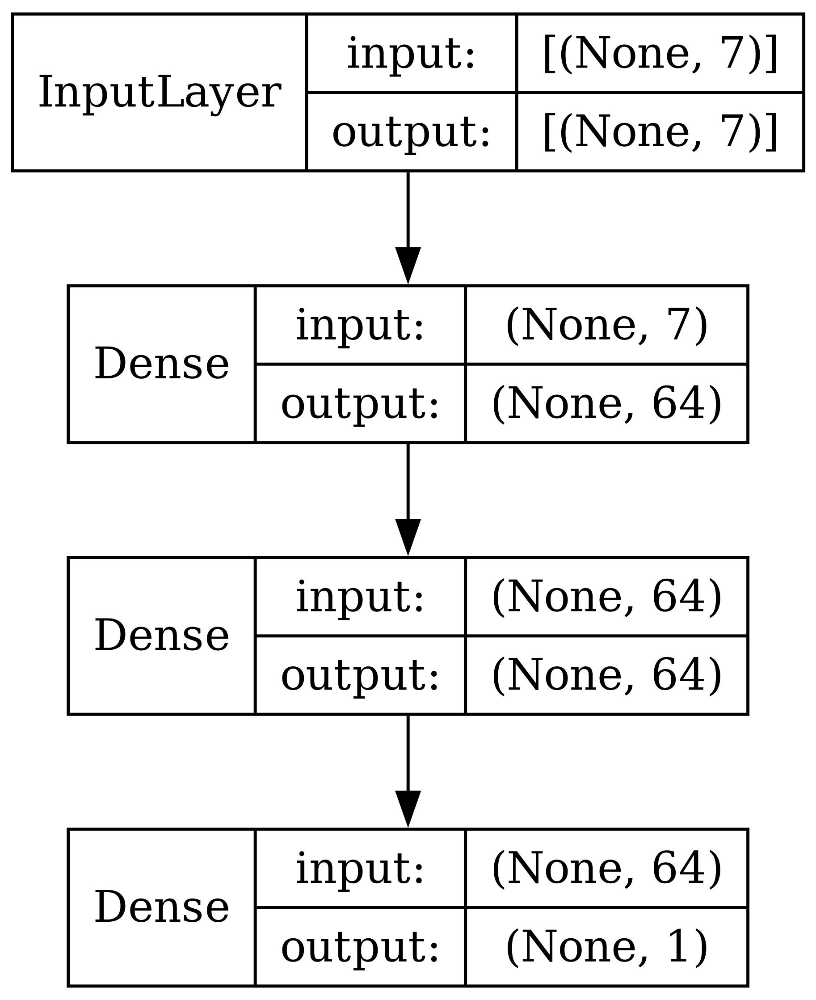

In [71]:
from tensorflow.keras.utils import plot_model
plot_model(
    model,
    to_file="model.jpg",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=False,
    rankdir="TB",
    expand_nested=False,
    dpi=500
)

# Fitting

> Note that the model uses the test data for validation after each epoch but won't be trained on them, [check the keras documentation](https://keras.io/api/models/model_training_apis/)

In [45]:
result = model.fit(x_train,
                   y_train,
                   epochs=150,
                   validation_data=(x_test,y_test),
                   callbacks=[checkpoint]
                  )

Epoch 1/150
10/10 [==============================] - 4s 27ms/step - loss: 579.5640 - mae: 22.6383 - val_loss: 574.4677 - val_mae: 22.5617
Epoch 2/150
10/10 [==============================] - 0s 7ms/step - loss: 515.0050 - mae: 21.0468 - val_loss: 503.1253 - val_mae: 20.7840
Epoch 3/150
10/10 [==============================] - 0s 7ms/step - loss: 438.5696 - mae: 18.9418 - val_loss: 413.6011 - val_mae: 18.2614
Epoch 4/150
 1/10 [==>...........................] - ETA: 0s - loss: 455.2073 - mae: 20.1610

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 0s 7ms/step - loss: 345.3954 - mae: 15.9435 - val_loss: 309.9063 - val_mae: 14.6998
Epoch 5/150
10/10 [==============================] - 0s 7ms/step - loss: 249.5485 - mae: 12.7414 - val_loss: 214.5941 - val_mae: 11.9040
Epoch 6/150
10/10 [==============================] - 0s 7ms/step - loss: 178.4004 - mae: 10.8320 - val_loss: 158.1796 - val_mae: 10.9675
Epoch 7/150
10/10 [==============================] - 0s 7ms/step - loss: 146.7049 - mae: 10.3000 - val_loss: 132.2179 - val_mae: 10.2564
Epoch 8/150
10/10 [==============================] - 0s 7ms/step - loss: 128.1720 - mae: 9.6986 - val_loss: 109.4402 - val_mae: 9.2478
Epoch 9/150
10/10 [==============================] - 0s 7ms/step - loss: 106.5660 - mae: 8.7416 - val_loss: 89.6463 - val_mae: 8.1786
Epoch 10/150
10/10 [==============================] - 0s 7ms/step - loss: 88.7333 - mae: 7.8151 - val_loss: 72.7678 - val_mae: 7.1796
Epoch 11/150
10/10 [==============================] - 0s 7ms/

# Test Results

In [67]:
from keras.models import load_model
from sklearn.metrics import   r2_score 

best_model=load_model('/kaggle/working/best_model.h5')
results = best_model.evaluate(x_test, y_test,verbose=0)
y_pred = best_model.predict(x_test, verbose=0)
r2 = r2_score(y_test, y_pred)

print("     Test MSE: {:.4f}".format(results[0]))
print("     Test MAE: {:.4f}".format(results[1]))
print("      Test R2: {:.4f}".format(r2))

     Test MSE: 10.7755
     Test MAE: 2.5666
      Test R2: 0.8118


# Training & Validation curves

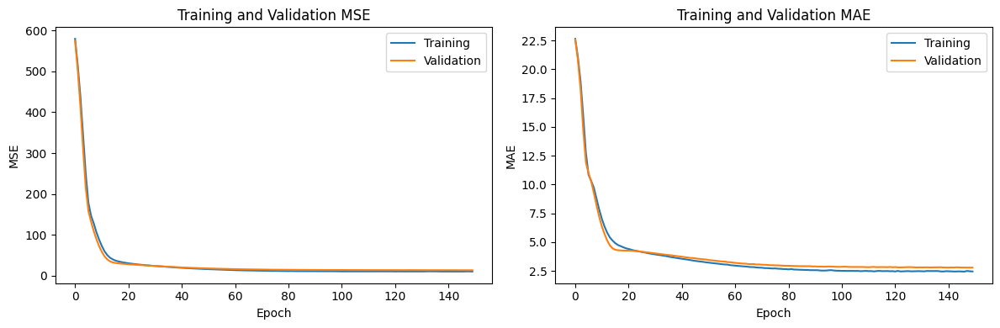

In [47]:
plt.figure(figsize=(12, 4))

# Plotting mse
plt.subplot(1, 2, 1)
plt.plot(result.history['loss'])
plt.plot(result.history['val_loss'])
plt.legend(['Training', 'Validation'])
plt.title('Training and Validation MSE')
plt.xlabel('Epoch')
plt.ylabel('MSE')

# Plotting mae
plt.subplot(1, 2, 2)
plt.plot(result.history['mae'])
plt.plot(result.history['val_mae'])
plt.legend(['Training', 'Validation'])
plt.title('Training and Validation MAE')
plt.xlabel('Epoch')
plt.ylabel('MAE')

plt.tight_layout()  
plt.savefig('Train-Validation_Curves', dpi=950)
plt.show()

> No signs of over fitting 

# Deployment code 

> The following code could be used to intergrate the saved fitted model in any system and make predictions on a new sample  

## Framework 



In [95]:
# Making predictions on a new sample
sample = [8, 307.0000, 130.0000, 3504, 12.0000 ,70, 'USA']
# it is important to have the new sample in this exact order 

# Create one-hot encoding for the origin feature
is_usa = int(sample[-1] == 'USA')
is_europe = int(sample[-1] == 'Europe')

# Drop the 'origin' element from the sample
sample = sample[:-1]

# Add the encoding at the end 
sample.extend([is_usa, is_europe])

# Load the fitted scaler to scale the new sample
from pickle import load 
with open('x_scaler.pkl', 'rb') as f:
        scaler = load(f)

sample = scaler.transform([sample])

# Load the fitten model to make prediction
from keras.models import load_model
best_model = load_model('/kaggle/working/best_model.h5')

best_model.predict(sample, verbose=0)[0][0]

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


14.96069